In [38]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from scipy import stats
from scipy.stats import chi2_contingency
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.ensemble import GradientBoostingRegressor



In [34]:
df = pd.read_csv('Cleaned_dataset.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 452088 entries, 0 to 452087
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Date_of_journey    452088 non-null  object 
 1   Journey_day        452088 non-null  object 
 2   Airline            452088 non-null  object 
 3   Flight_code        452088 non-null  object 
 4   Class              452088 non-null  object 
 5   Source             452088 non-null  object 
 6   Departure          452088 non-null  object 
 7   Total_stops        452088 non-null  object 
 8   Arrival            452088 non-null  object 
 9   Destination        452088 non-null  object 
 10  Duration_in_hours  452088 non-null  float64
 11  Days_left          452088 non-null  int64  
 12  Fare               452088 non-null  int64  
dtypes: float64(1), int64(2), object(10)
memory usage: 44.8+ MB


In [35]:
df = pd.read_csv('Cleaned_dataset.csv')

df['Date_of_journey'] = pd.to_datetime(df['Date_of_journey'])

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 452088 entries, 0 to 452087
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   Date_of_journey    452088 non-null  datetime64[ns]
 1   Journey_day        452088 non-null  object        
 2   Airline            452088 non-null  object        
 3   Flight_code        452088 non-null  object        
 4   Class              452088 non-null  object        
 5   Source             452088 non-null  object        
 6   Departure          452088 non-null  object        
 7   Total_stops        452088 non-null  object        
 8   Arrival            452088 non-null  object        
 9   Destination        452088 non-null  object        
 10  Duration_in_hours  452088 non-null  float64       
 11  Days_left          452088 non-null  int64         
 12  Fare               452088 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(2), 

In [7]:
print(df.describe())


       Duration_in_hours      Days_left           Fare
count      452088.000000  452088.000000  452088.000000
mean           12.349222      25.627902   22840.100890
std             7.431478      14.300846   20307.963002
min             0.750000       1.000000    1307.000000
25%             6.583300      13.000000    8762.750000
50%            11.333300      26.000000   13407.000000
75%            16.500000      38.000000   35587.000000
max            43.583300      50.000000  143019.000000


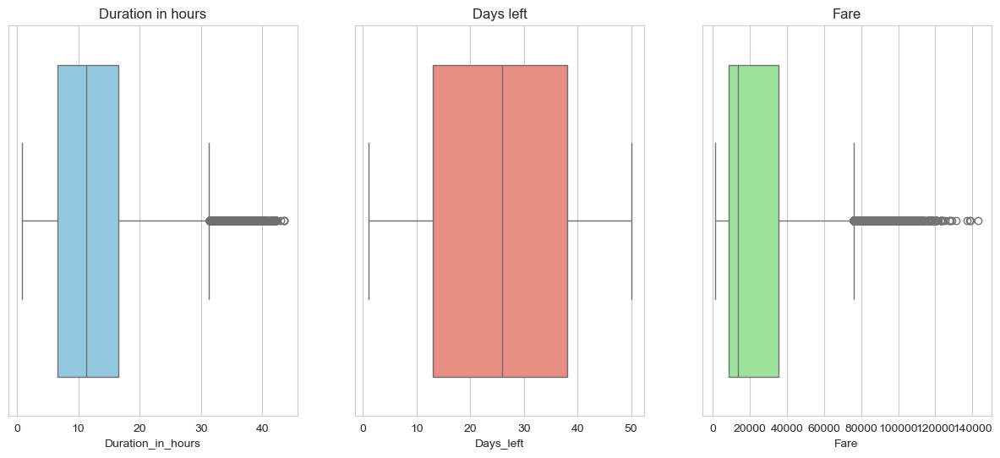

In [8]:
sns.set_style("whitegrid")

fig, axs = plt.subplots(ncols=3, figsize=(15,6))

sns.boxplot(data=df, x='Duration_in_hours', ax=axs[0], color='skyblue')
axs[0].set_title('Duration in hours')

sns.boxplot(data=df, x='Days_left', ax=axs[1], color='salmon')
axs[1].set_title('Days left')

sns.boxplot(data=df, x='Fare', ax=axs[2], color='lightgreen')
axs[2].set_title('Fare')

plt.show()

In [9]:
# Converting Date_of_journey to datetime format
df['Date_of_journey'] = pd.to_datetime(df['Date_of_journey'])

# Creating a new column for day of the week
df['day_of_week'] = df['Date_of_journey'].dt.day_name()

# Grouping the data by day of the week, and calculating the mean Fare
daily_fares = df.groupby('day_of_week')['Fare'].mean()

# Print the result
print(daily_fares)

day_of_week
Friday       22657.178705
Monday       23116.319344
Saturday     22997.830926
Sunday       23060.107836
Thursday     22228.820322
Tuesday      22652.499669
Wednesday    23143.844645
Name: Fare, dtype: float64


/var/folders/ym/tk_2kjy51f17rq8s0ryw9nh40000gn/T/ipykernel_61730/3468448369.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  daily_fares = df.groupby('day_of_week')['Fare'].mean()


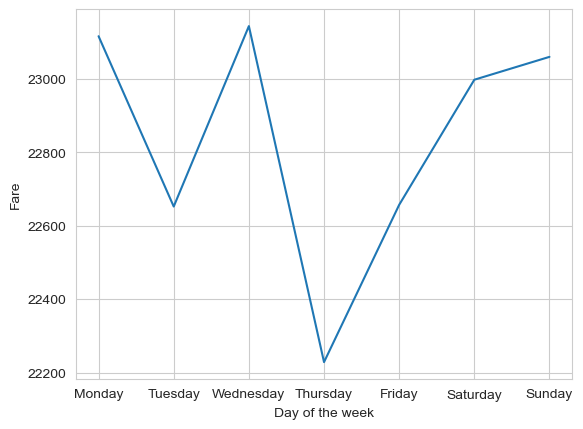

In [ ]:
df['day_of_week'] = df['Date_of_journey'].dt.day_name()

day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
cat_dtype = pd.api.types.CategoricalDtype(categories=day_order, ordered=True)

df['day_of_week'] = df['day_of_week'].astype(cat_dtype)

daily_fares = df.groupby('day_of_week')['Fare'].mean()

plt.plot(daily_fares.index, daily_fares.values)
plt.xlabel('Day of the week')
plt.ylabel('Fare')
plt.show()

In [39]:
fig = px.box(df, y = "Fare", x = 'Airline', color_discrete_sequence = ["orange"], template = 'seaborn')
fig.show()

/var/folders/ym/tk_2kjy51f17rq8s0ryw9nh40000gn/T/ipykernel_61730/3410233800.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




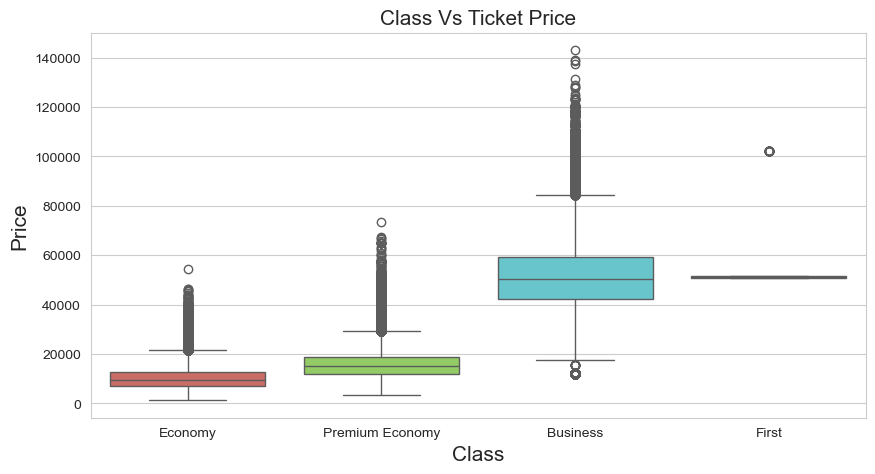

In [40]:
plt.figure(figsize=(10,5))
sns.boxplot(x='Class',y='Fare',data=df,palette='hls')
plt.title('Class Vs Ticket Price',fontsize=15)
plt.xlabel('Class',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

/var/folders/ym/tk_2kjy51f17rq8s0ryw9nh40000gn/T/ipykernel_61730/11345801.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




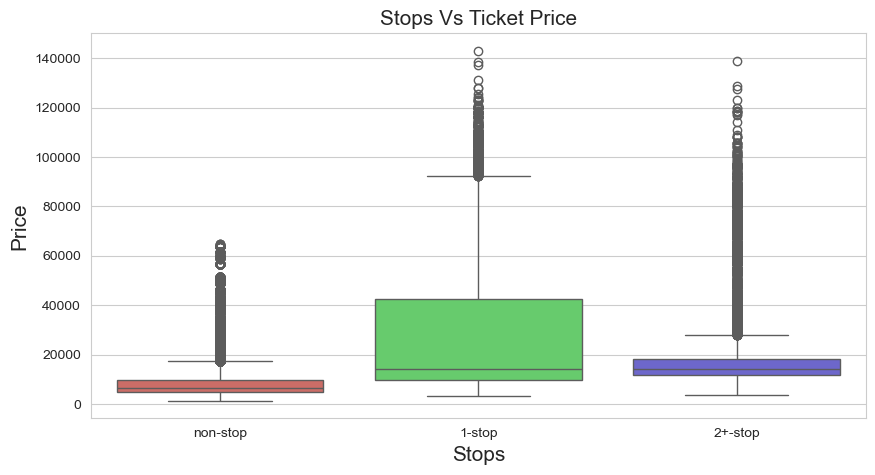

In [41]:
plt.figure(figsize=(10,5))
sns.boxplot(x='Total_stops',y='Fare',data=df,palette='hls')
plt.title('Stops Vs Ticket Price',fontsize=15)
plt.xlabel('Stops',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

/var/folders/ym/tk_2kjy51f17rq8s0ryw9nh40000gn/T/ipykernel_61730/654580100.py:8: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




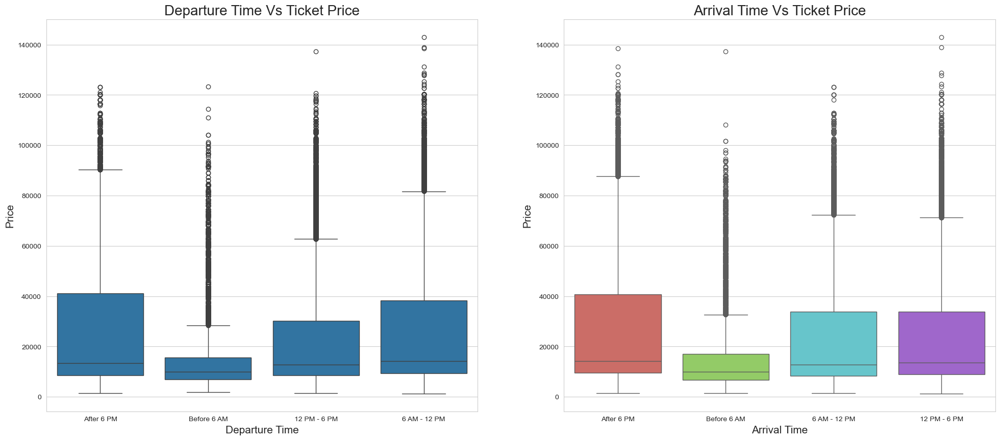

In [42]:
plt.figure(figsize=(24,10))
plt.subplot(1,2,1)
sns.boxplot(x='Departure',y='Fare',data=df)
plt.title('Departure Time Vs Ticket Price',fontsize=20)
plt.xlabel('Departure Time',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.subplot(1,2,2)
sns.boxplot(x='Arrival',y='Fare',data=df,palette='hls')
plt.title('Arrival Time Vs Ticket Price',fontsize=20)
plt.xlabel('Arrival Time',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

/var/folders/ym/tk_2kjy51f17rq8s0ryw9nh40000gn/T/ipykernel_61730/1834295389.py:8: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




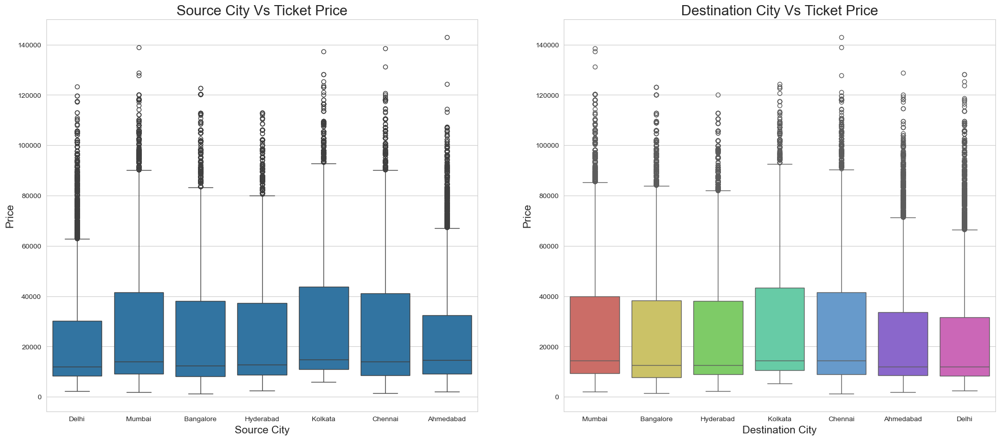

In [43]:
plt.figure(figsize=(24,10))
plt.subplot(1,2,1)
sns.boxplot(x='Source',y='Fare',data=df)
plt.title('Source City Vs Ticket Price',fontsize=20)
plt.xlabel('Source City',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.subplot(1,2,2)
sns.boxplot(x='Destination',y='Fare',data=df,palette='hls')
plt.title('Destination City Vs Ticket Price',fontsize=20)
plt.xlabel('Destination City',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

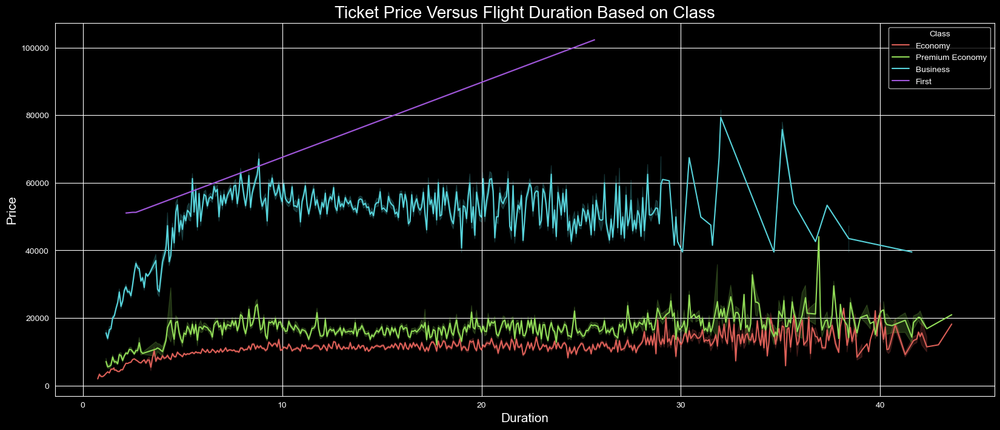

In [44]:
plt.style.use('dark_background')
plt.figure(figsize=(20,8))
sns.lineplot(data = df,x = 'Duration_in_hours',y = 'Fare',hue = 'Class',palette = 'hls')
plt.title('Ticket Price Versus Flight Duration Based on Class',fontsize = 20)
plt.xlabel('Duration',fontsize = 15)
plt.ylabel('Price',fontsize = 15)
plt.show()

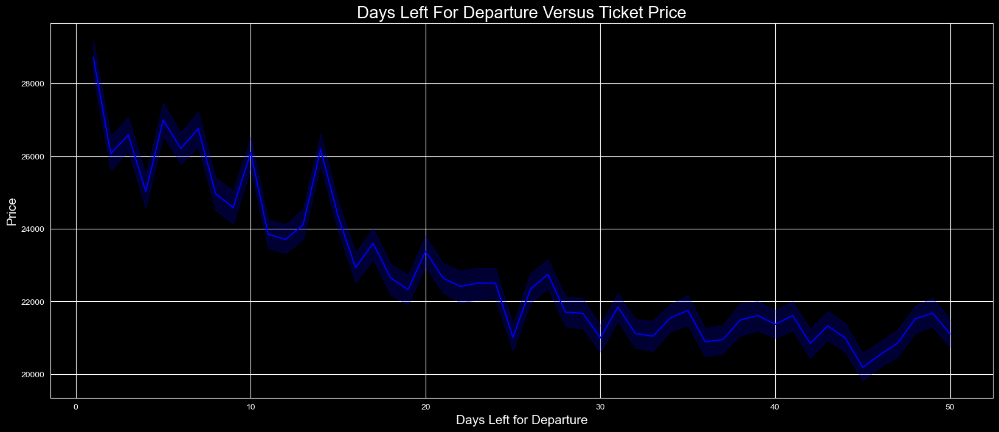

In [45]:
plt.figure(figsize=(20,8))
sns.lineplot(data=df,x='Days_left',y='Fare',color='blue')
plt.title('Days Left For Departure Versus Ticket Price',fontsize=20)
plt.xlabel('Days Left for Departure',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

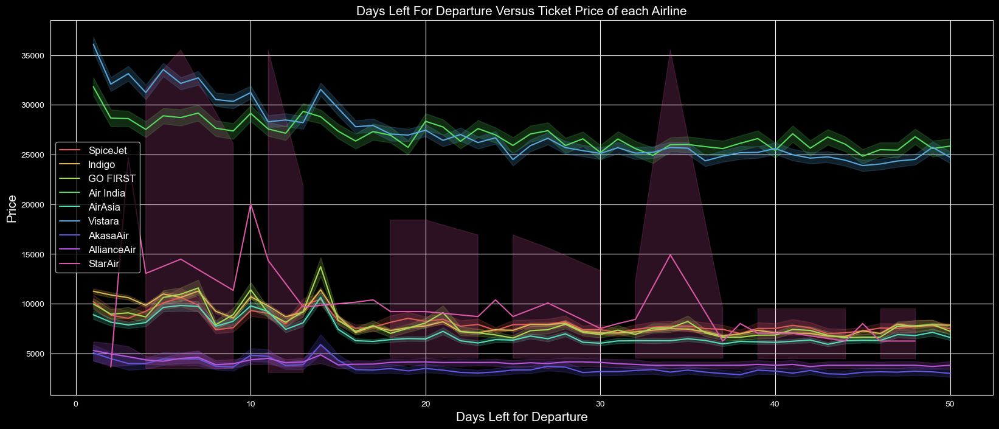

In [46]:
plt.figure(figsize=(20,8))
sns.lineplot(data=df,x='Days_left',y='Fare',color='blue',hue='Airline',palette='hls')
plt.title('Days Left For Departure Versus Ticket Price of each Airline',fontsize=15)
plt.legend(fontsize=12)
plt.xlabel('Days Left for Departure',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

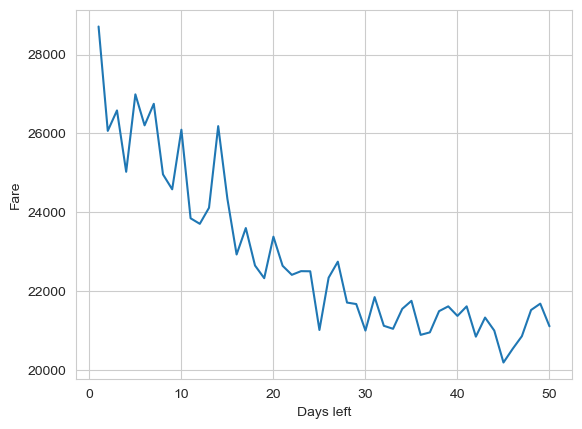

In [11]:
# Group the data by Days_left and calculate the mean Fare
daily_fares = df.groupby('Days_left')['Fare'].mean()

# Plot the time series
plt.plot(daily_fares.index, daily_fares.values)
plt.xlabel('Days left')
plt.ylabel('Fare')
plt.show()

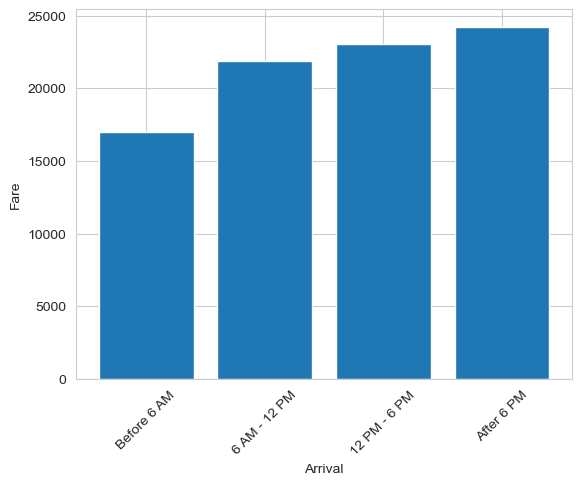

In [13]:
# Group the data by Arrival and calculate the mean Fare
arrival_fares = df.groupby('Arrival')['Fare'].mean().sort_values()

# Plot the bar chart
plt.bar(arrival_fares.index, arrival_fares.values)
plt.xticks(rotation=45)
plt.xlabel('Arrival')
plt.ylabel('Fare')
plt.show()

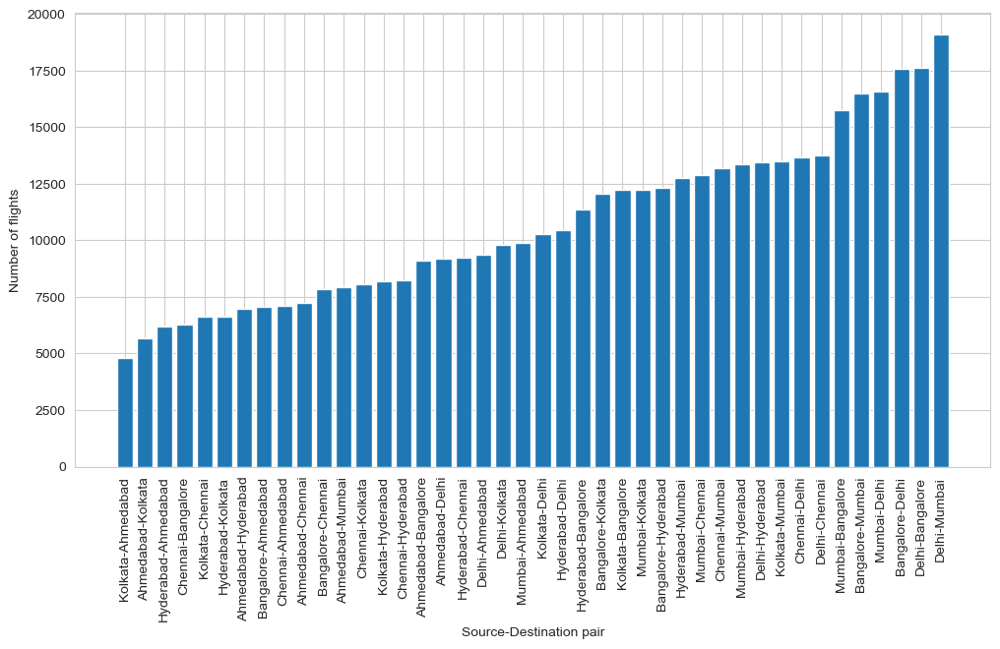

In [14]:
# Count the number of flights for each source-destination pair
flight_count = df.groupby(['Source', 'Destination']).size().reset_index(name='Count')

# Sort the data by count
flight_count = flight_count.sort_values(by='Count')

# Plot a bar chart of the flight count by source-destination pairs
fig = plt.figure(figsize=(12, 6))
plt.bar(flight_count['Source'] + '-' + flight_count['Destination'], flight_count['Count'])
plt.xticks(rotation=90)
plt.xlabel('Source-Destination pair')
plt.ylabel('Number of flights')
plt.show()

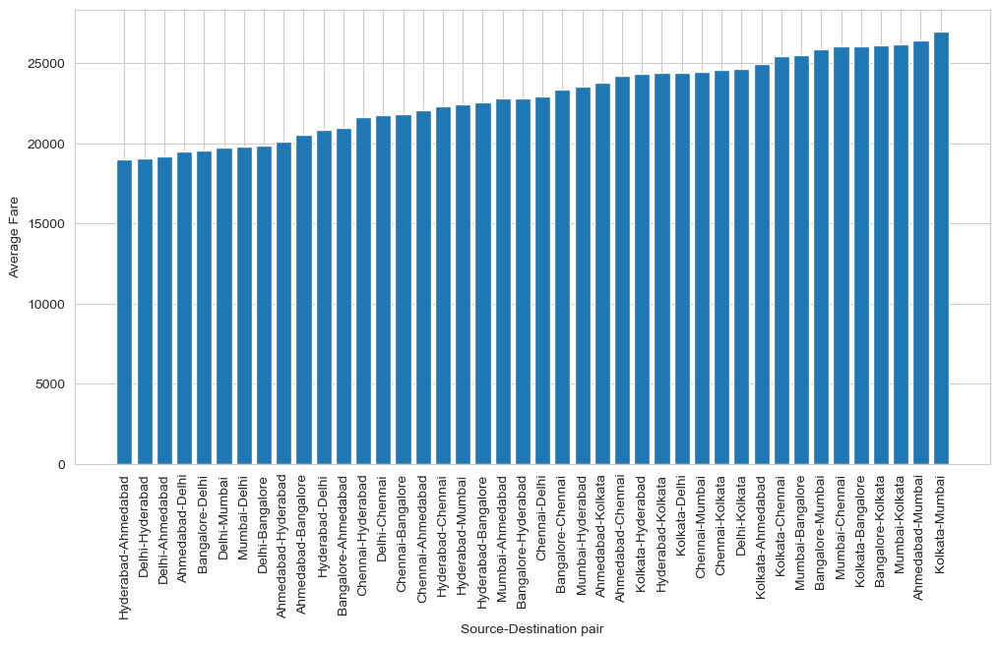

In [15]:
# Calculate the mean fare for each source-destination pair
mean_fare = df.groupby(['Source', 'Destination'])['Fare'].mean().reset_index(name='Mean Fare')

# Sort the data by mean fare
mean_fare = mean_fare.sort_values(by='Mean Fare')

# Plot a bar chart of the mean fare by source-destination pairs
fig = plt.figure(figsize=(12, 6))
plt.bar(mean_fare['Source'] + '-' + mean_fare['Destination'], mean_fare['Mean Fare'])
plt.xticks(rotation=90)
plt.xlabel('Source-Destination pair')
plt.ylabel('Average Fare')
plt.show()

In [49]:
# Function to check the association between categorical variables with Fare
def measure_association(df, fixed_variable, variable):
    # Create a contingency table between the two variables
    contingency_table = pd.crosstab(df[fixed_variable], df[variable])
    # Calculate the chi-square test statistic and the corresponding P-value
    chi2_stat, p_val, dof, expected = chi2_contingency(contingency_table)
    
    # Check if the P-value is less than 0.5
    if p_val < 0.5:
        return "Correlated"
    else:
        return "Not correlated"

In [19]:
# Check association between Fare and Route
association = measure_association(df, "Fare", "route")
print(association)

Correlated


In [20]:
# Check association between Fare and Airline
association = measure_association(df, "Fare", "Airline")
print(association)

Correlated


In [21]:
# Check association between Fare and Class
association = measure_association(df, "Fare", "Class")
print(association)

Correlated


In [22]:
# Check association between Fare and Journey_day
association = measure_association(df, "Fare", "day_of_week")
print(association)

Correlated


In [23]:
# Check association between Fare and Arrival
association = measure_association(df, "Fare", "Arrival")
print(association)

Correlated


In [24]:
#Function to check the correlation coefficient of numeric variable
def measure_correlation(data, variable):
    # Calculate the correlation coefficient and P-value between Fare and the variable
    correlation_coef, p_val = stats.pearsonr(data['Fare'], data[variable])
    
    # Check if the P-value is less than 0.5
    if p_val < 0.5:
        return f"Correlated: correlation coefficient = {correlation_coef:.2f}"
    else:
        return "Not correlated"

In [25]:
# Check association between Fare and Arrival
correlation = measure_correlation(df,"Duration_in_hours")
print(association)

Correlated


In [26]:
# Check association between Fare and Arrival
correlation = measure_correlation(df,"Days_left")
print(association)

Correlated


In [27]:
# Dropping Non correlated columns
# create a list of columns to be dropped
columns_to_drop = ['Date_of_journey','Journey_day','Flight_code','Source','Destination']

# drop the columns using the drop function
df = df.drop(columns_to_drop, axis=1)

In [28]:
# Performing one hot encoding to make data prediction ready
# Select the categorical columns
categorical_cols = ['Airline', 'Class', 'Departure', 'Arrival', 'day_of_week', 'route','Total_stops']

# Perform one-hot encoding
df_encoded = pd.get_dummies(df, columns=categorical_cols)

In [29]:
df_encoded

,Duration_in_hours,Days_left,Fare,Airline_Air India,Airline_AirAsia,Airline_AkasaAir,Airline_AllianceAir,Airline_GO FIRST,Airline_Indigo,Airline_SpiceJet,...,route_Kolkata-Mumbai,route_Mumbai-Ahmedabad,route_Mumbai-Bangalore,route_Mumbai-Chennai,route_Mumbai-Delhi,route_Mumbai-Hyderabad,route_Mumbai-Kolkata,Total_stops_1-stop,Total_stops_2+-stop,Total_stops_non-stop
0,2.0833,1,5335,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,True
1,2.3333,1,5899,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,True
2,2.1667,1,5801,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,True
3,2.0833,1,5794,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,True
4,2.1667,1,5955,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452083,13.0833,50,65028,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False
452084,11.2500,50,69254,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False
452085,11.2500,50,69254,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False
452086,11.1667,50,72980,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False


In [30]:
# Define the predictor and target variables
X = df_encoded.drop('Fare', axis=1)
y = df_encoded['Fare']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a linear regression model and fit the data
model = LinearRegression()
model.fit(X_train, y_train)

# Predict the fares for the test set
y_pred = model.predict(X_test)

# Evaluate the performance of the model using R-squared
r2 = r2_score(y_test, y_pred)
print("R-squared score:", r2)

R-squared score: 0.8546811437935974


In [31]:
# Generate random predictions
n_samples = len(X_test)
y_pred = np.random.randint(low=y_train.min(), high=y_train.max()+1, size=n_samples)

# Evaluate the performance of the model using R-squared
r2 = r2_score(y_test, y_pred)
print("Random R-squared score:", r2)

Random R-squared score: -9.250953772773201


In [32]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Gradient Boosting Regressor with default parameters
gbr = GradientBoostingRegressor()

# Train the model on the training data
gbr.fit(X_train, y_train)

# Use the trained model to make predictions on the testing data
y_pred = gbr.predict(X_test)

# Evaluate the performance of the model using R-squared
r2 = r2_score(y_test, y_pred)
print("R-squared score:", r2)

R-squared score: 0.894098754697262


In [33]:
import xgboost as xgb
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror')
xgb_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = xgb_model.predict(X_test)

# Calculate the R-squared score
r2 = r2_score(y_test, y_pred)
print("R-squared score:", r2)

R-squared score: 0.9354731357537307
